## Plot abs, diff, diff for PI and PD



In [53]:
# load and autoreload
from IPython import get_ipython
from IPython.display import clear_output
from matplotlib import colors
from useful_scit.imps import (plt)
from sect_sens.data_info.simulation_types import get_abs_by_type

from sect_sens.constants import get_plotpath
from sect_sens.data_info.simulation_types import get_casen_by_type_mod
from sect_sens.util.imports import get_averaged_fields
from sect_sens.util.practical_functions import make_folders
from sect_sens.util.slice_average.significance import load_and_plot_sign

# noinspection PyBroadException
try:
    _ipython = get_ipython()
    _magic = _ipython.magic
    _magic('load_ext autoreload')
    _magic('autoreload 2')
except ImportError:
    pass

from sect_sens.util.plot.maps_PIPD import abs_diffs_PI_PD_sep

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [54]:
import cartopy.crs as ccrs

### Div settings: 

In [55]:
p_level = 1013.
pmin = 850.  # minimum pressure level
avg_over_lev = True  # True#True#False#True
pressure_adjust = True  # Can only be false if avg_over_lev false. Plots particular hybrid sigma lev
p_levels = [1013., 900., 800., 700., 600.]  # used if not avg

In [56]:
model = 'NorESM'

startyear = '0004-01'
endyear = '0008-12'

In [57]:
cases_sec = [
    'NF1850_SECT_ctrl',
    'NF1850_aeroxid2014_SECT_ctrl'
]
cases_orig = [
    'NF1850_noSECT_def',
    'NF1850_aeroxid2014_noSECT_def',
    'NF1850_aeroxid2014_noSECT_ox_ricc',
    'NF1850_noSECT_ox_ricc'
]

cases = cases_orig + cases_sec

### For output names:

In [58]:
version = 'pi_pd_diff'
plot_path = get_plotpath('maps')
filen_base = plot_path + '/%s' % version
# print(plot_path)
make_folders(plot_path)

In [59]:
print(filen_base)

/home/ubuntu/mnts/nird/projects//Plots_SECT_SENS/maps//pi_pd_diff


### Variables to load:

In [60]:
varl = ['NCONC01', 'NMR01', 'N_AER', 'NCONC08', 'NCONC09', 'NMR08', 'NMR09', 'ACTNL_incld',
        'ACTREL_incld', 'CDNUMC', 'cb_NA', 'cb_SOA_NA', 'cb_SO4_NA', 'AWNC_incld', 'AREL_incld',
        'TGCLDLWP', 'DIR_Ghan', 'SWCF_Ghan', 'LWCF_Ghan', 'NCFT_Ghan', 'N50', 'N100',
        'N250', 'N150', 'N200', 'SIGMA01', 'NMR01', 'NCONC01']
subfig_size = 2.9
asp_ratio = .9
print(varl)

['NCONC01', 'NMR01', 'N_AER', 'NCONC08', 'NCONC09', 'NMR08', 'NMR09', 'ACTNL_incld', 'ACTREL_incld', 'CDNUMC', 'cb_NA', 'cb_SOA_NA', 'cb_SO4_NA', 'AWNC_incld', 'AREL_incld', 'TGCLDLWP', 'DIR_Ghan', 'SWCF_Ghan', 'LWCF_Ghan', 'NCFT_Ghan', 'N50', 'N100', 'N250', 'N150', 'N200', 'SIGMA01', 'NMR01', 'NCONC01']


In [61]:

case_dic = get_averaged_fields.get_maps_cases(cases,
                                              varl,
                                              startyear,
                                              endyear,
                                              avg_over_lev=avg_over_lev,
                                              pmin=pmin,
                                              pressure_adjust=pressure_adjust,
                                              p_level=p_level,
                                              )

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def/NCONC01_0004-01-0008-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def/NMR01_0004-01-0008-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def/N_AER_0004-01-0008-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def/NCONC08_0004-01-0008-12_avg2lev850.nc


/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/xarray/coding/times.py:426: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/numpy/core/_asarray.py:85: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return array(a, dtype, copy=False, order=order)


Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def/NCONC09_0004-01-0008-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def/NMR08_0004-01-0008-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def/NMR09_0004-01-0008-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def/ACTNL_incld_0004-01-0008-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def/ACTREL_incld_0004-01-0008-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def/CDNUMC_0004-01-0008-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850

## Calculate various variables:

In [62]:
for case in cases:
    _ds = case_dic[case]
    _ds['NPF_frac'] = _ds['NCONC01'] / _ds['N_AER'] * 100
    _ds['NPF_frac'].attrs['units'] = '%'
if 'NPF_frac' not in varl:
    varl.append('NPF_frac')

### Organize data in easy to use format:

In [63]:
relative = False

dic_abs = get_abs_by_type(case_dic,
                          case_types=['PI', 'PIaerPD'],
                          mod_types=None)

['PI', 'PIaerPD'] ['OsloAeroSec', 'OsloAero$_{imp}$', 'OsloAero$_{def}$']


## Plots:

/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


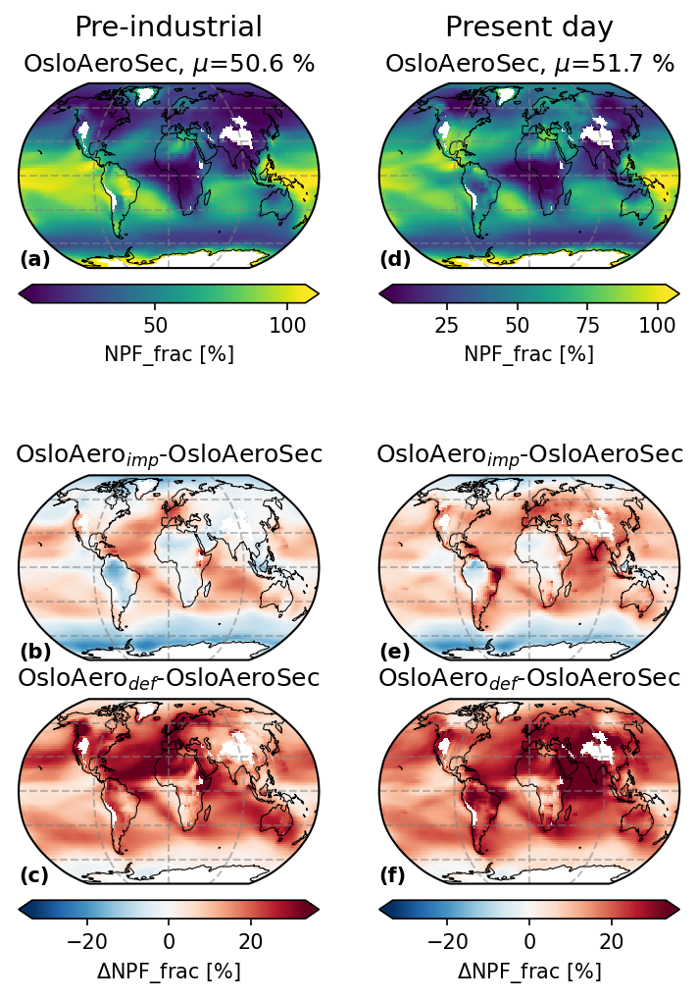

In [25]:
var = 'NPF_frac'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,

                                   # , 'ACTNL_incld', 'ACTREL_incld'],
                                   # norm_abs=norm_abs,
                                   # norm_dic=norm_dic
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'}
                                   )

fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

## Settings for colorbars:

In [26]:
norm_dic = dict(
    SOA_LV=colors.SymLogNorm(vmin=-5e-1, vmax=5e-1, linthresh=.01, base=10, linscale=.4),
    H2SO4=colors.SymLogNorm(vmin=-5e-1, vmax=5e-1, linthresh=.01, base=10, linscale=.4),
    NCONC01=colors.SymLogNorm(vmin=-1e3, vmax=1e3, linthresh=10, base=10, linscale=.4),
    NMR01=colors.SymLogNorm(vmin=-10, vmax=10, linthresh=1, base=10),  # linscale=.5),
    AWNC_incld=colors.SymLogNorm(vmin=-50, vmax=50, linthresh=1, base=10),
    ACTNL_incld=colors.SymLogNorm(vmin=-40, vmax=40, linthresh=1, linscale=0.4, base=10),
    AREL_incld=colors.SymLogNorm(vmin=-5, vmax=5, linthresh=.1, base=10),
    ACTREL_incld=colors.SymLogNorm(vmin=-7, vmax=7, linthresh=.1, base=10, linscale=0.5),
    CDNUMC=None,
    SWCF_Ghan=colors.Normalize(vmin=-2, vmax=2),
    LWCF_Ghan=colors.Normalize(vmin=-2, vmax=2),
    NCFT_Ghan=colors.Normalize(vmin=-2, vmax=2),

)
norm_dic_rel = dict(
    SOA_LV=colors.Normalize(vmin=-50, vmax=50),
    H2SO4=colors.Normalize(vmin=-50, vmax=50),
    NCONC01=colors.Normalize(vmin=-250, vmax=250),
    NMR01=colors.Normalize(vmin=-50, vmax=50),
    AWNC_incld=colors.Normalize(vmin=-50, vmax=50),
    ACTNL_incld=colors.Normalize(vmin=-13, vmax=13),
    AREL_incld=colors.Normalize(vmin=-10, vmax=10),
    ACTREL_incld=colors.Normalize(vmin=-7, vmax=7),
    CDNUMC=colors.Normalize(vmin=-12, vmax=12),

    SWCF_Ghan=colors.Normalize(vmin=-2, vmax=2),
    LWCF_Ghan=colors.Normalize(vmin=-2, vmax=2),
    NCFT_Ghan=colors.Normalize(vmin=-2, vmax=2),

)

norm_abs = norm_dic.copy()
norm_abs['SWCF_Ghan'] = colors.Normalize(vmin=-5, vmax=5)
norm_abs['LWCF_Ghan'] = colors.Normalize(vmin=-3, vmax=3)
norm_abs['NCFT_Ghan'] = colors.Normalize(vmin=-5, vmax=5)

norm_diff_dic = dict(
    ACTNL_incld=colors.Normalize(vmin=-20, vmax=20),
    N50=colors.Normalize(vmin=-45, vmax=45),
    N100=colors.Normalize(vmin=-20, vmax=20),
    N150=colors.Normalize(vmin=-10, vmax=10),  # colors.Normalize(vmin=-5, vmax=5),
    N200=colors.Normalize(vmin=-15, vmax=15),  # colors.Normalize(vmin=-5, vmax=5),
)

norm_diff_dic = dict(
    ACTNL_incld=colors.Normalize(vmin=-12, vmax=12),
    N50=colors.Normalize(vmin=-45, vmax=45),
    N100=colors.Normalize(vmin=-10, vmax=10),
    N150=colors.Normalize(vmin=-4, vmax=4),  # colors.Normalize(vmin=-5, vmax=5),
    N200=colors.Normalize(vmin=-5, vmax=5),  # colors.Normalize(vmin=-5, vmax=5),
)

norm_dic['NCFT_Ghan'] = colors.Normalize(vmin=-1.8, vmax=1.8)
norm_dic['ACNTL_incld'] = colors.SymLogNorm(vmin=-40, vmax=40, linthresh=1, linscale=0.4, base=10)

## define cases to be ctrl or other:

In [27]:
cases_oth = ['OsloAero$_{imp}$', 'OsloAero$_{def}$']
ctrl = 'OsloAeroSec'

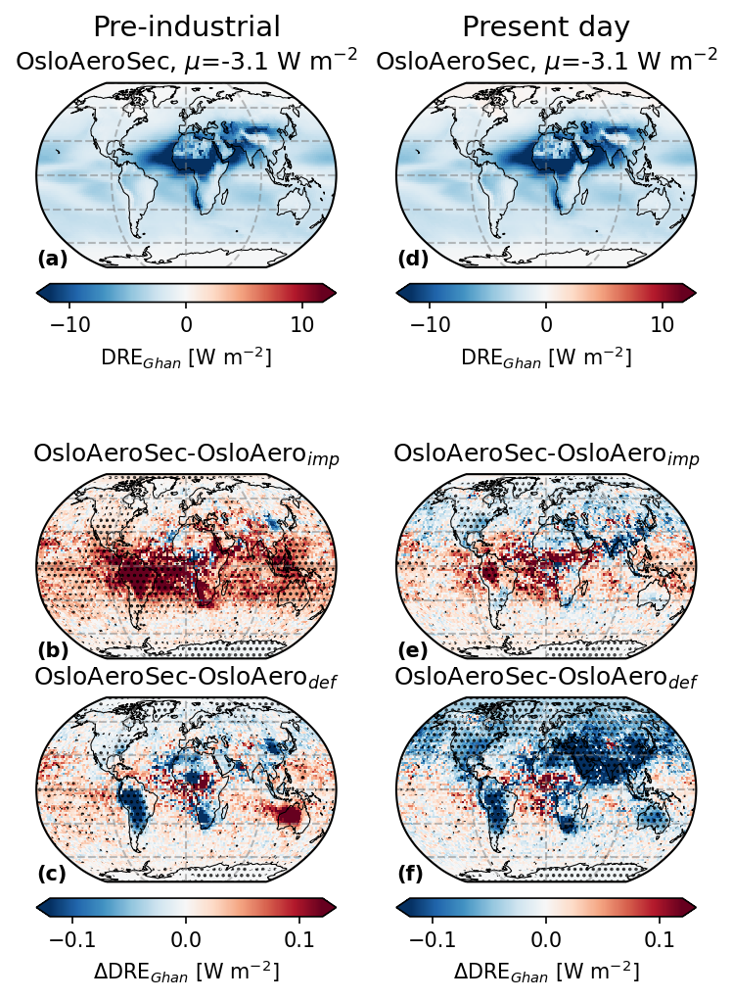

/home/ubuntu/mnts/nird/projects//Plots_SECT_SENS/maps//pi_pd_diffDIR_Ghan_PIPD_sep_relFalse.pdf


In [30]:
var = 'DIR_Ghan'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   # norm_diff = norm_dic['NCFT_Ghan'],
                                   norm_diff=colors.Normalize(vmin=-.12, vmax=.12)
                                   )

for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=None, hatch_lw=1, transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()

axs = [axs_dic['PI'][c] for c in ['OsloAeroSec', 'OsloAero$_{imp}$', 'OsloAero$_{def}$']]  # [cases_oth]
# subp_insert_abc(np.array(axs), pos_x=0.01,pos_y=1.0)
fn = filen_base + f'{var}_PIPD_sep_rel{relative}.pdf'
fig.savefig(fn, dpi=300)
plt.show()
print(fn)

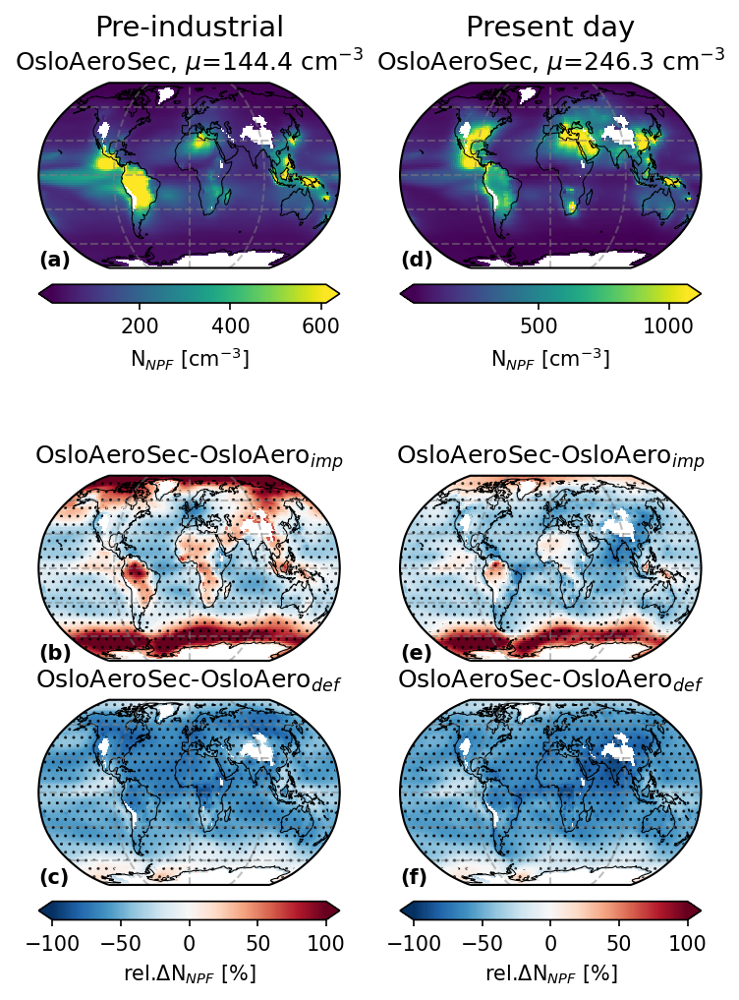

In [31]:
var = 'NCONC01'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   norm_diff=colors.Normalize(vmin=-100, vmax=100)
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False
                           )
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

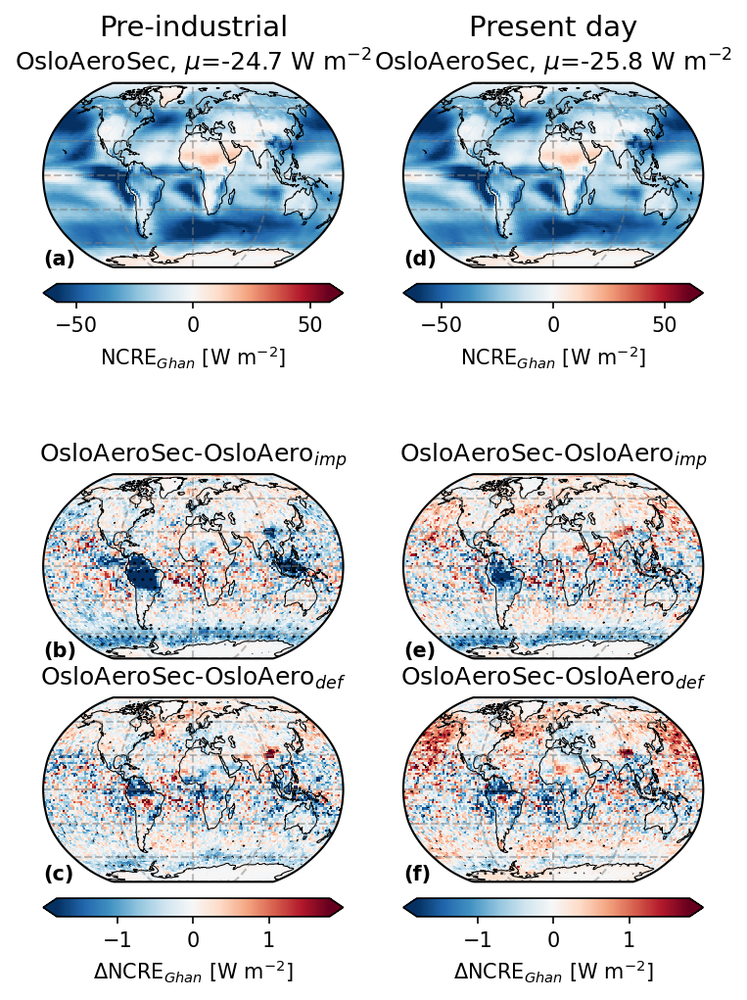

In [32]:
var = 'NCFT_Ghan'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   norm_diff=norm_dic['NCFT_Ghan'],
                                   cmap_abs='RdBu_r'
                                   # norm_diff=colors.Normalize(vmin=-100, vmax=100)
                                   )

for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
axs = [axs_dic['PI'][c] for c in ['OsloAeroSec', 'OsloAero$_{imp}$', 'OsloAero$_{def}$']]  # [cases_oth]
# subp_insert_abc(np.array(axs), pos_x=0.01,pos_y=1.0)
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

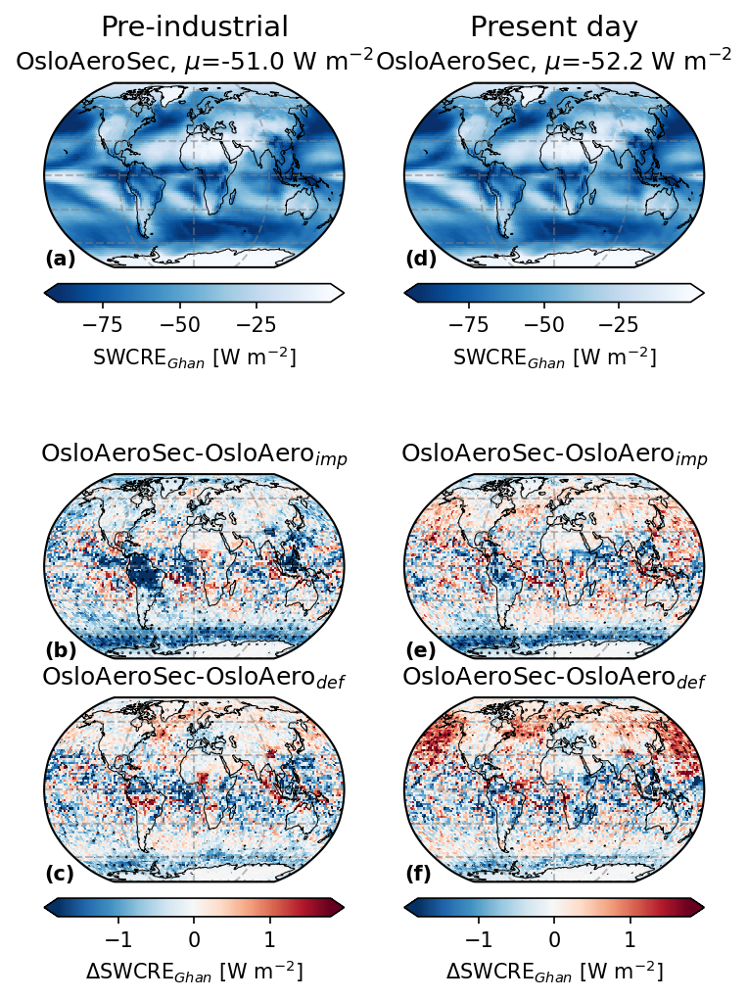

/home/ubuntu/mnts/nird/projects//Plots_SECT_SENS/maps//pi_pd_diffSWCF_Ghan_PIPD_sep_relFalse.pdf


In [33]:
var = 'SWCF_Ghan'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   norm_diff=norm_dic['NCFT_Ghan'],
                                   cmap_abs='Blues_r'
                                   # norm_diff=colors.Normalize(vmin=-100, vmax=100)
                                   )

for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()

fn = filen_base + f'{var}_PIPD_sep_rel{relative}.pdf'
fig.savefig(fn, dpi=300)
plt.show()
print(fn)

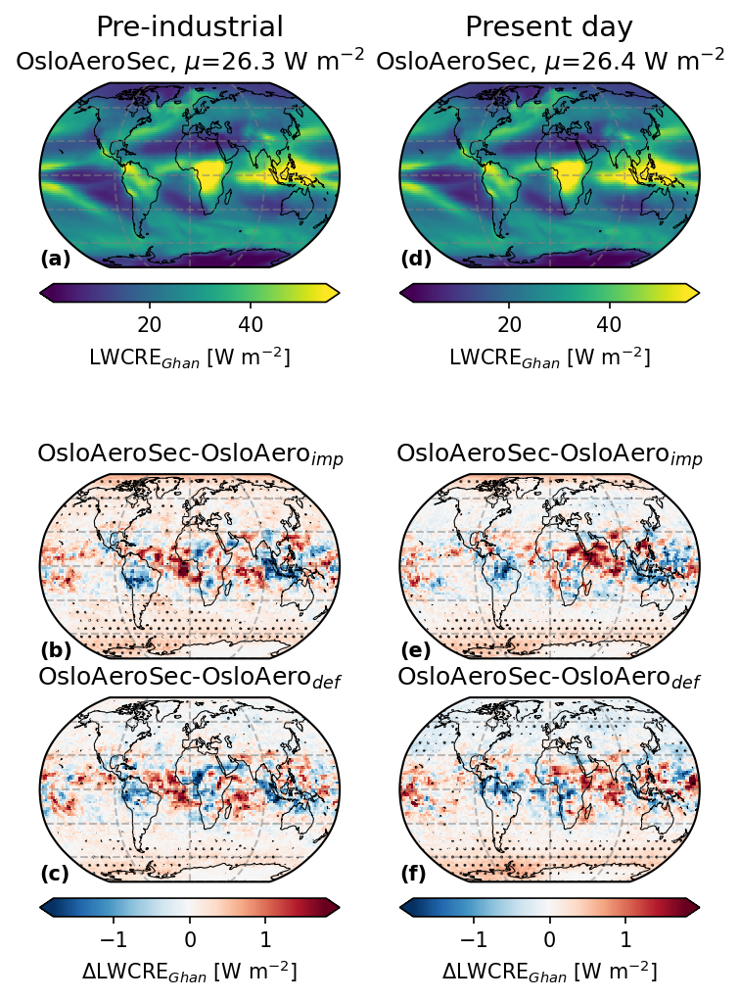

/home/ubuntu/mnts/nird/projects//Plots_SECT_SENS/maps//pi_pd_diffLWCF_Ghan_PIPD_sep_relFalse.pdf


In [34]:
var = 'LWCF_Ghan'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   norm_diff=norm_dic['NCFT_Ghan'],
                                   # norm_diff=colors.Normalize(vmin=-100, vmax=100)
                                   )

for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()

fn = filen_base + f'{var}_PIPD_sep_rel{relative}.pdf'
fig.savefig(fn, dpi=300)
plt.show()
print(fn)

In [35]:
print(fn)

/home/ubuntu/mnts/nird/projects//Plots_SECT_SENS/maps//pi_pd_diffLWCF_Ghan_PIPD_sep_relFalse.pdf


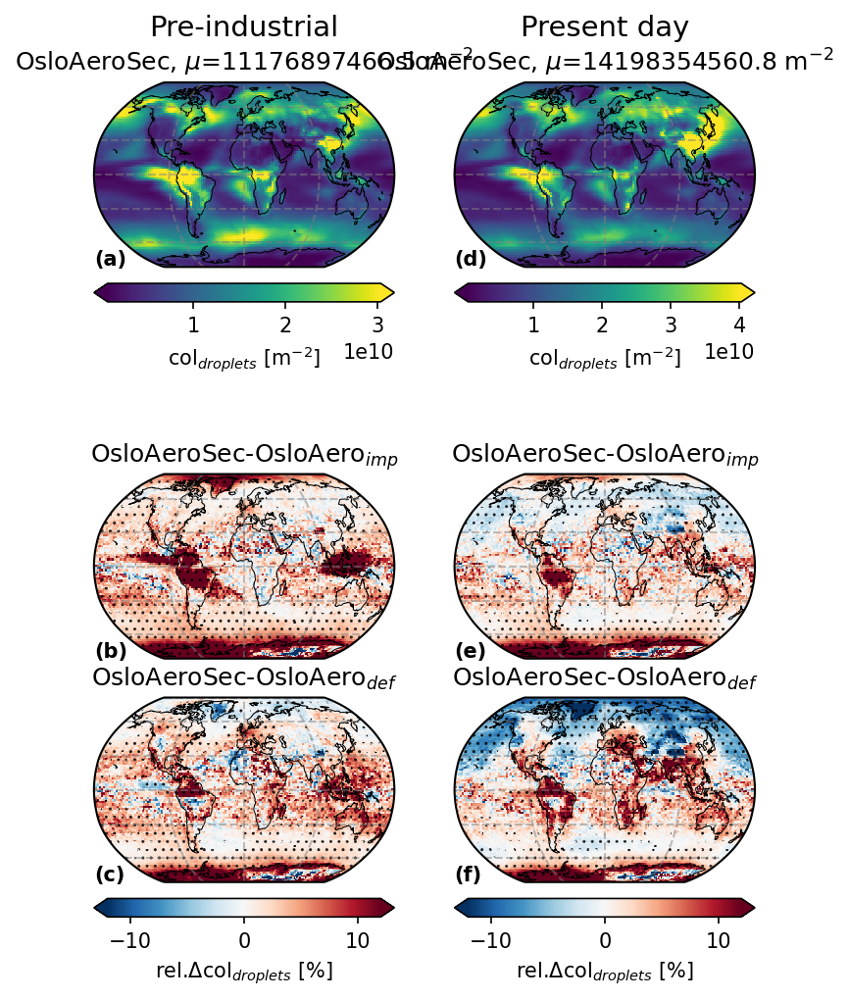

/home/ubuntu/mnts/nird/projects//Plots_SECT_SENS/maps//pi_pd_diffCDNUMC_PIPD_sep_relTrue.pdf


In [36]:
var = 'CDNUMC'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   norm_diff=colors.Normalize(vmin=-12, vmax=12)
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fn = filen_base + f'{var}_PIPD_sep_rel{relative}.pdf'
fig.savefig(fn, dpi=300)
plt.show()
print(fn)

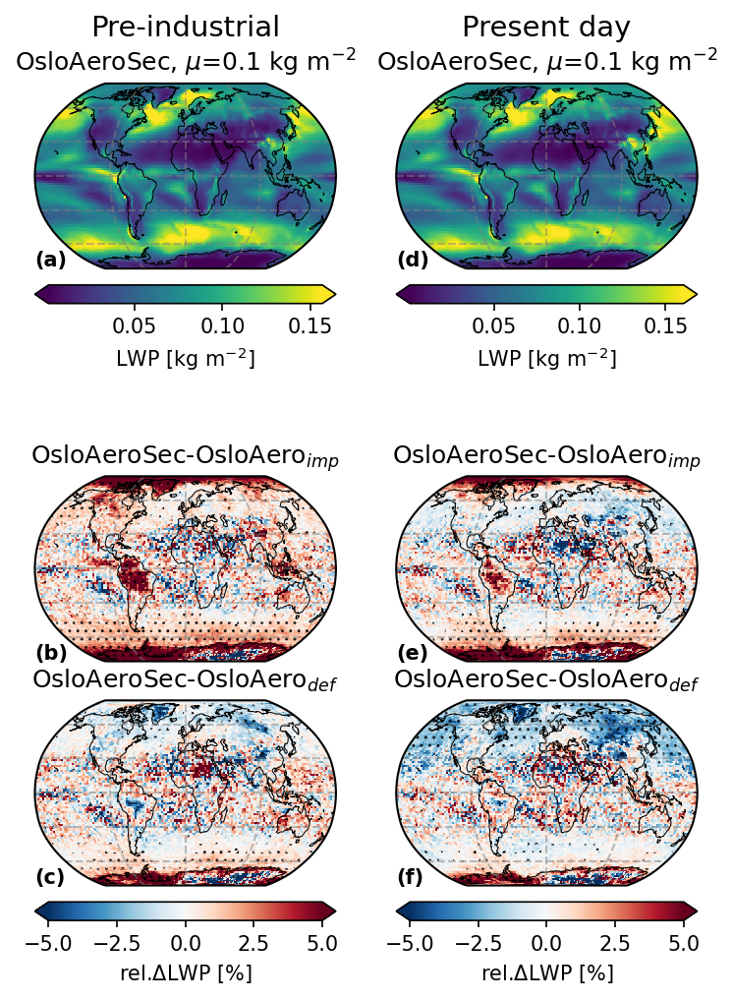

/home/ubuntu/mnts/nird/projects//Plots_SECT_SENS/maps//pi_pd_diffTGCLDLWP_PIPD_sep_relTrue.pdf


In [37]:
var = 'TGCLDLWP'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   norm_diff=colors.Normalize(vmin=-5, vmax=5)
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fn = filen_base + f'{var}_PIPD_sep_rel{relative}.pdf'
fig.savefig(fn, dpi=300)
plt.show()
print(fn)

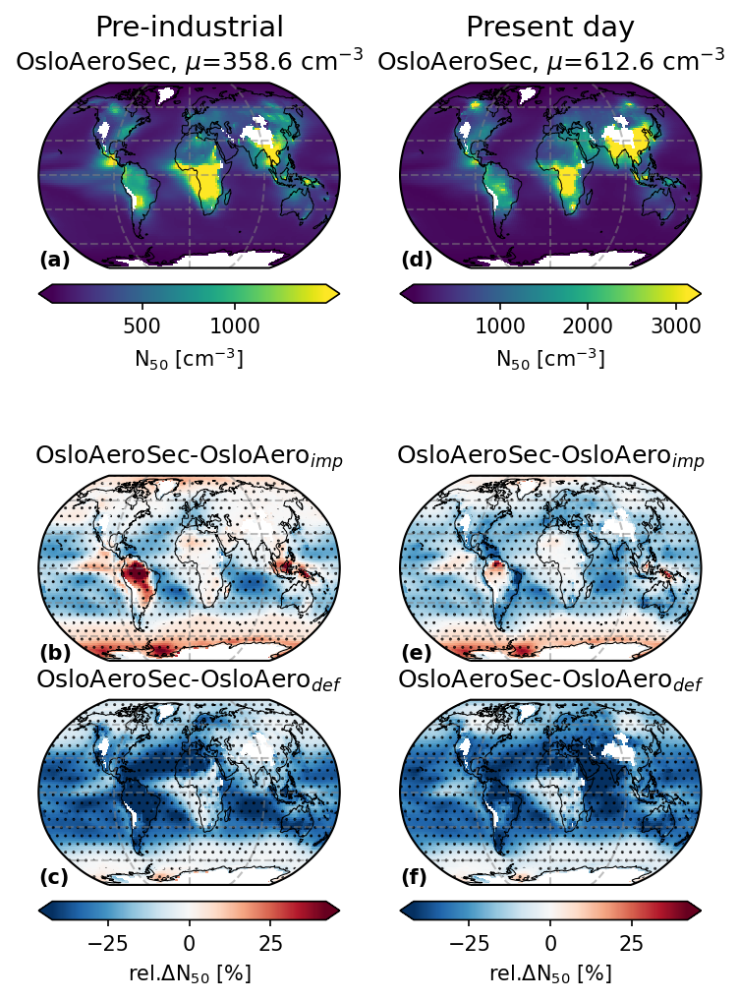

In [38]:
var = 'N50'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   # norm_diff=colors.Normalize(vmin=-30, vmax=30)
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

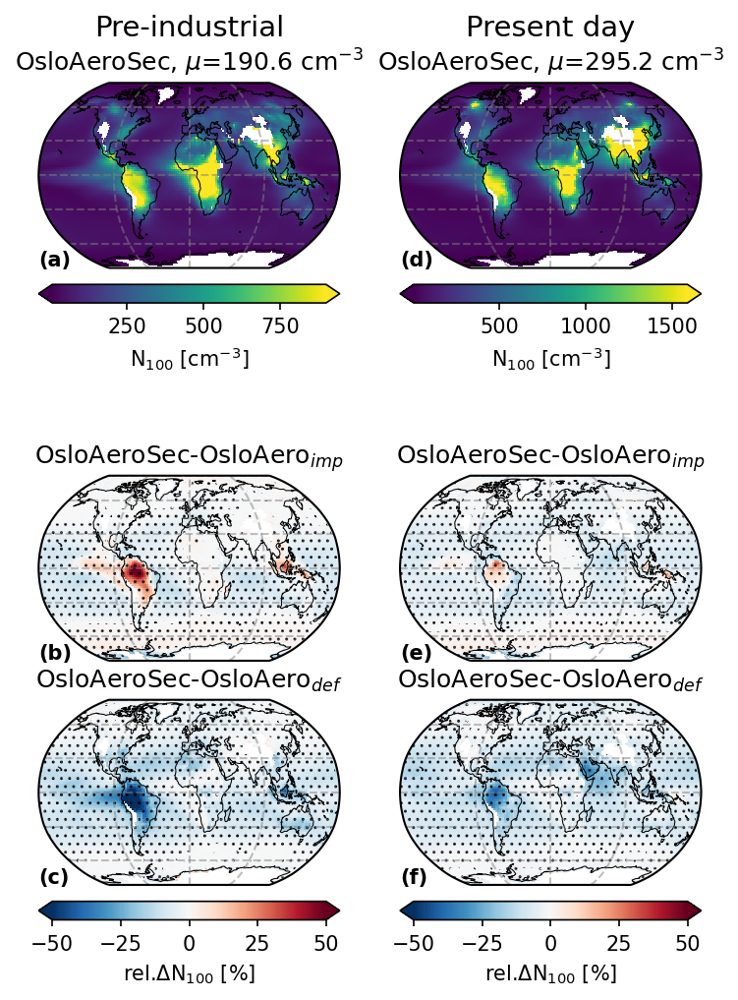

In [64]:
var = 'N100'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   norm_diff=colors.Normalize(vmin=-50, vmax=50)
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

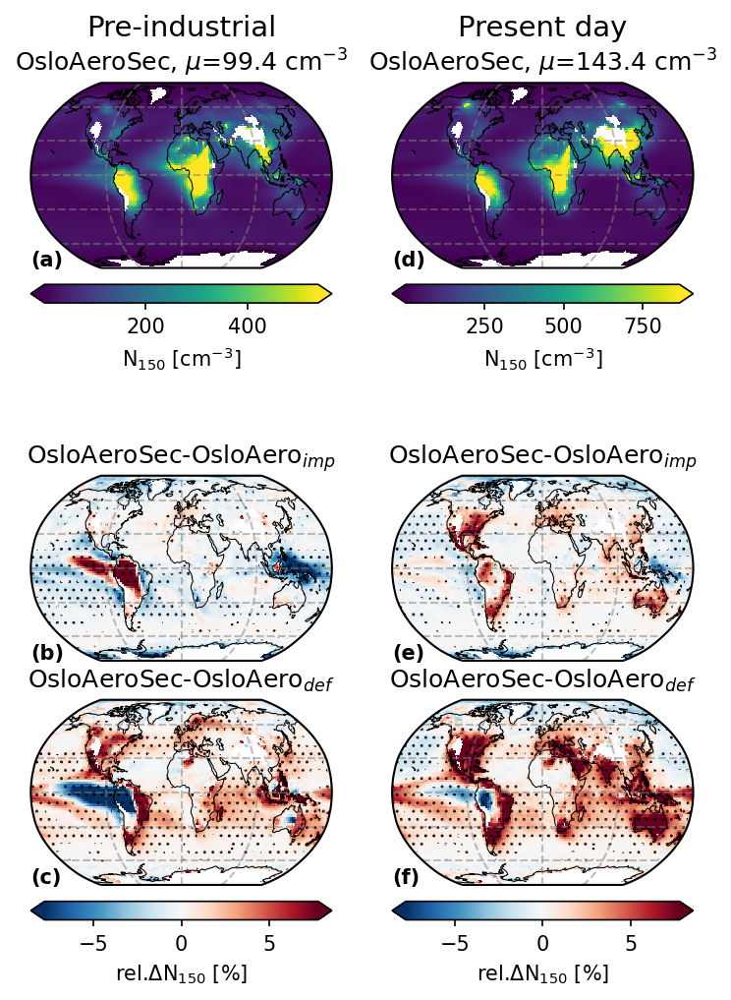

In [65]:
var = 'N150'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   # norm_diff=colors.Normalize(vmin=-100, vmax=100)
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

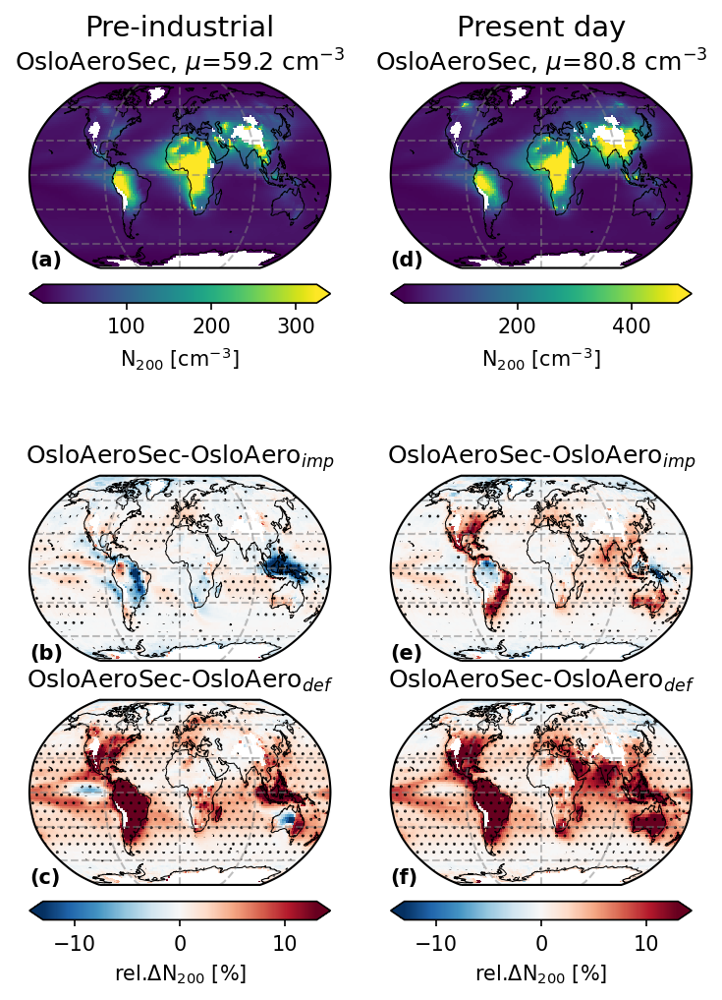

In [66]:
var = 'N200'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   norm_diff=colors.Normalize(vmin=-13, vmax=+13)
                                   # norm_diff=colors.Normalize(vmin=-100, vmax=100)
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,

                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

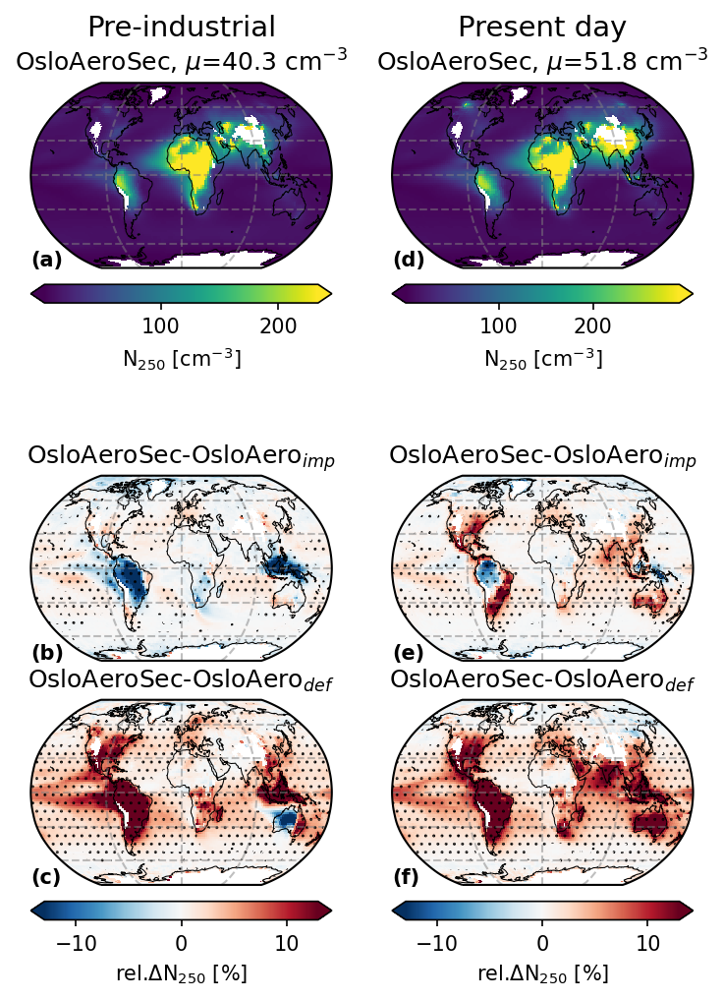

In [67]:
var = 'N250'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   # norm_diff=colors.Normalize(vmin=-100, vmax=100)
                                   norm_diff=colors.Normalize(vmin=-13, vmax=+13)
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,

                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

/home/ubuntu/mnts/nird/projects//Plots_SECT_SENS/maps//pi_pd_diffAWNC_incld_PIPD_sep_relTrue.pdf


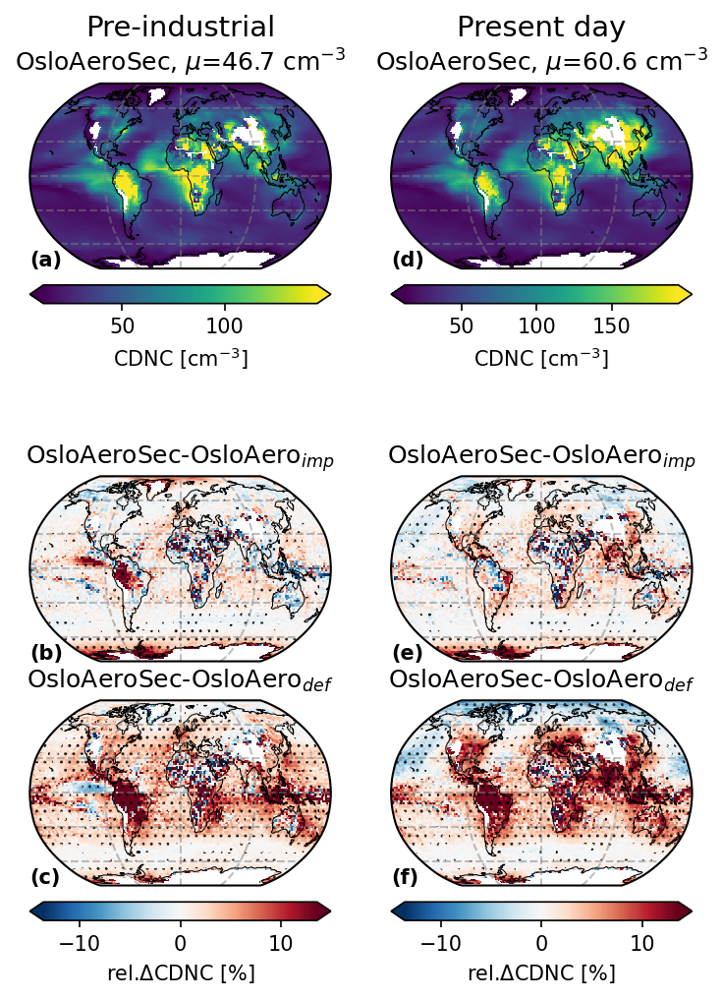

In [68]:
var = 'AWNC_incld'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   # norm_diff=colors.Normalize(vmin=-100, vmax=100)
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fn = filen_base + f'{var}_PIPD_sep_rel{relative}.pdf'
fig.savefig(fn, dpi=300)
print(fn)
plt.show()

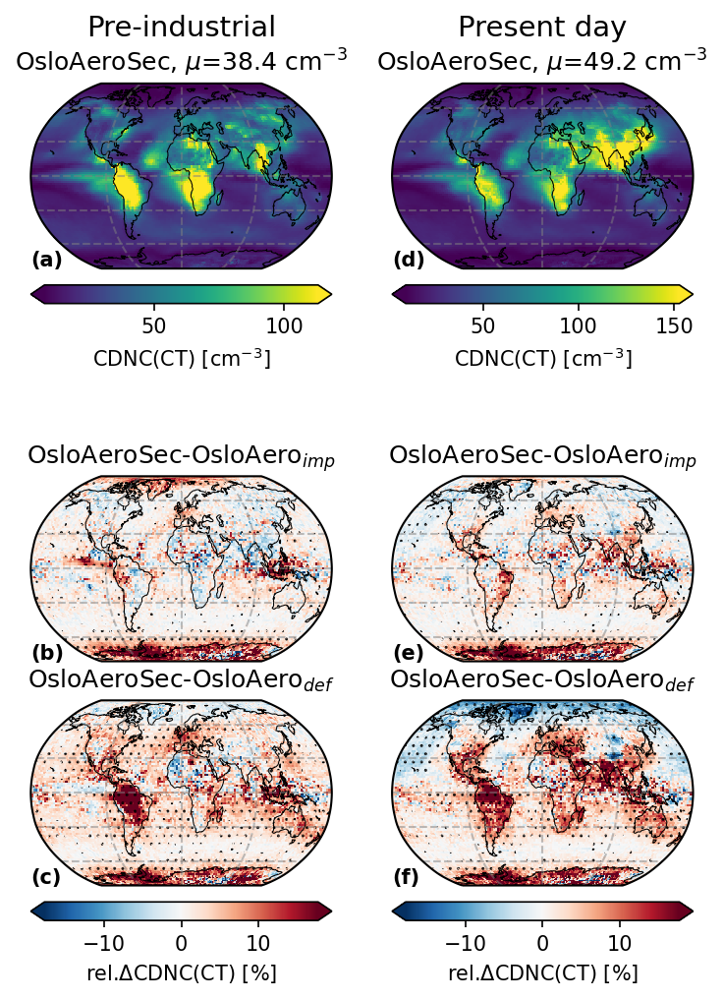

In [69]:
var = 'ACTNL_incld'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True,
                                   # norm_diff=colors.Normalize(vmin=-100, vmax=100)
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fn = filen_base + f'{var}_PIPD_sep_rel{relative}.pdf'
fig.savefig(fn, dpi=300)
plt.show()

In [70]:

print(fn)

/home/ubuntu/mnts/nird/projects//Plots_SECT_SENS/maps//pi_pd_diffACTNL_incld_PIPD_sep_relTrue.pdf


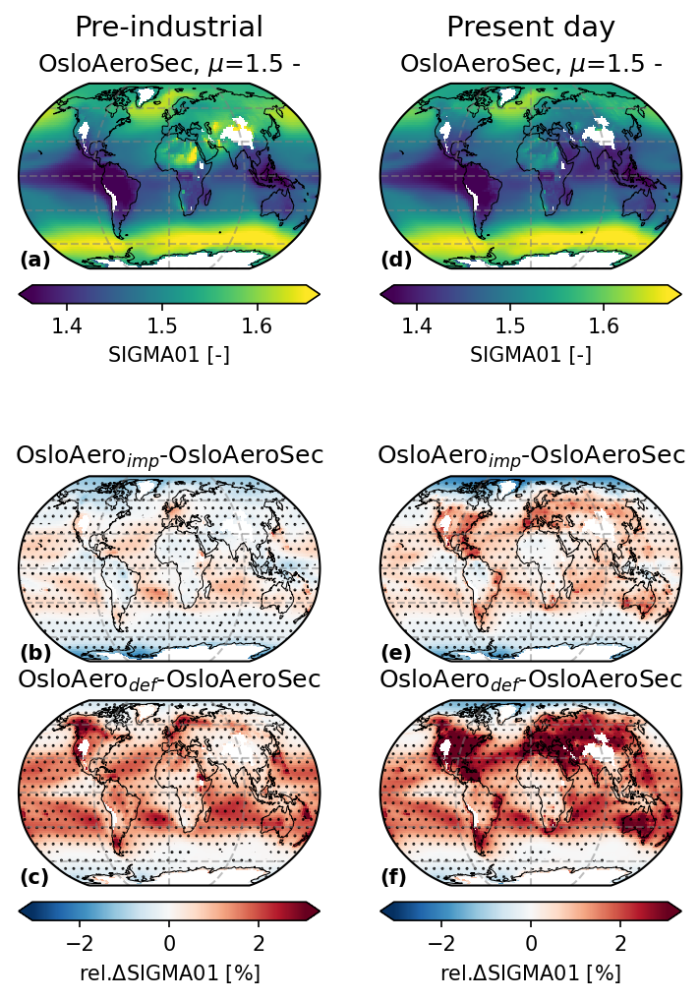

In [71]:
var = 'SIGMA01'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,

                                   # , 'ACTNL_incld', 'ACTREL_incld'],
                                   # norm_abs=norm_abs,
                                   # norm_dic=norm_dic
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'}
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

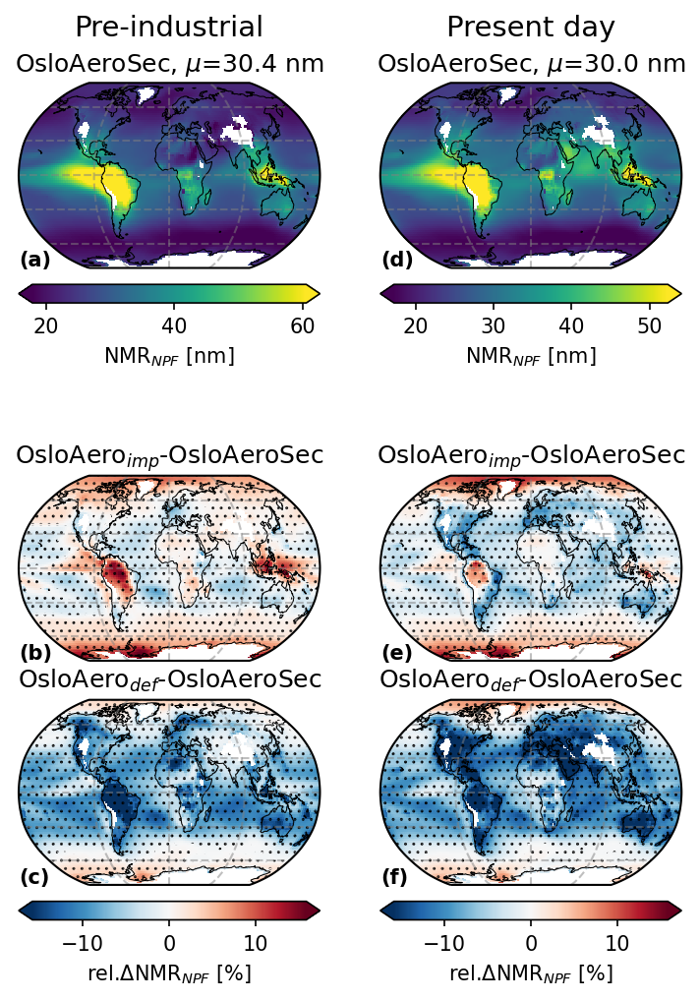

In [72]:
var = 'NMR01'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,

                                   # , 'ACTNL_incld', 'ACTREL_incld'],
                                   # norm_abs=norm_abs,
                                   # norm_dic=norm_dic
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'}
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

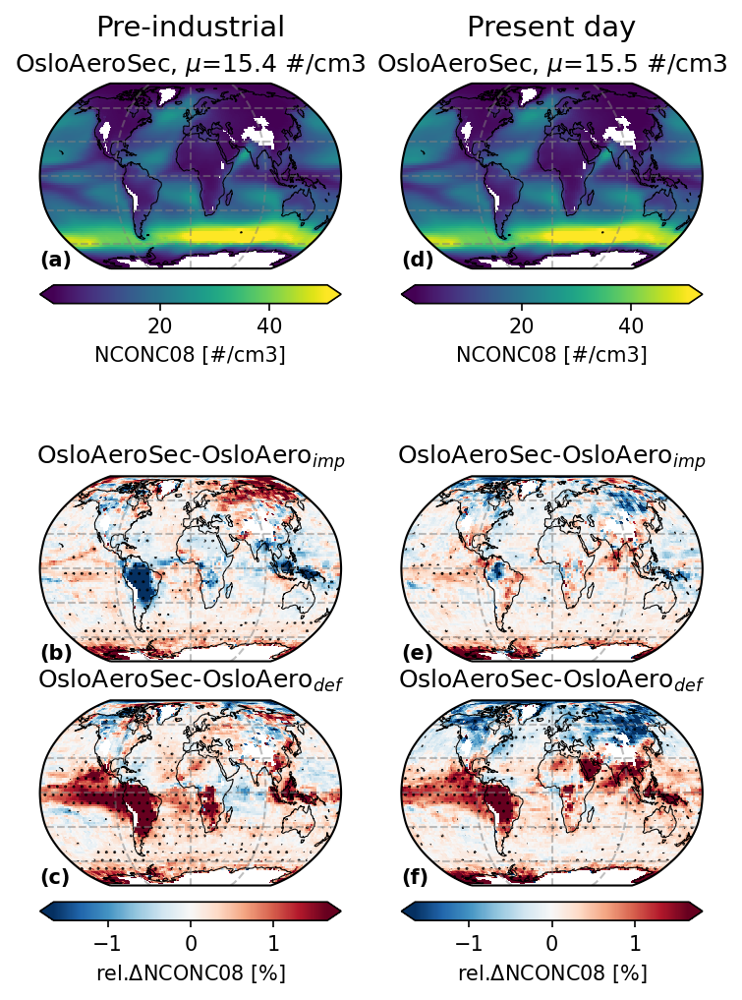

In [73]:
var = 'NCONC08'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True

                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

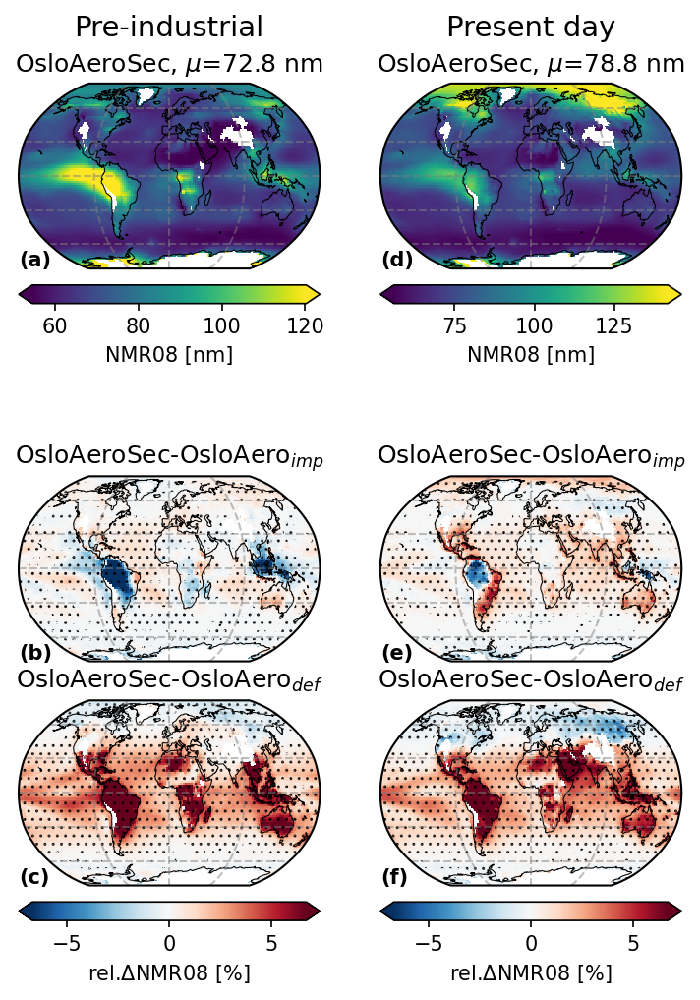

In [74]:
var = 'NMR08'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

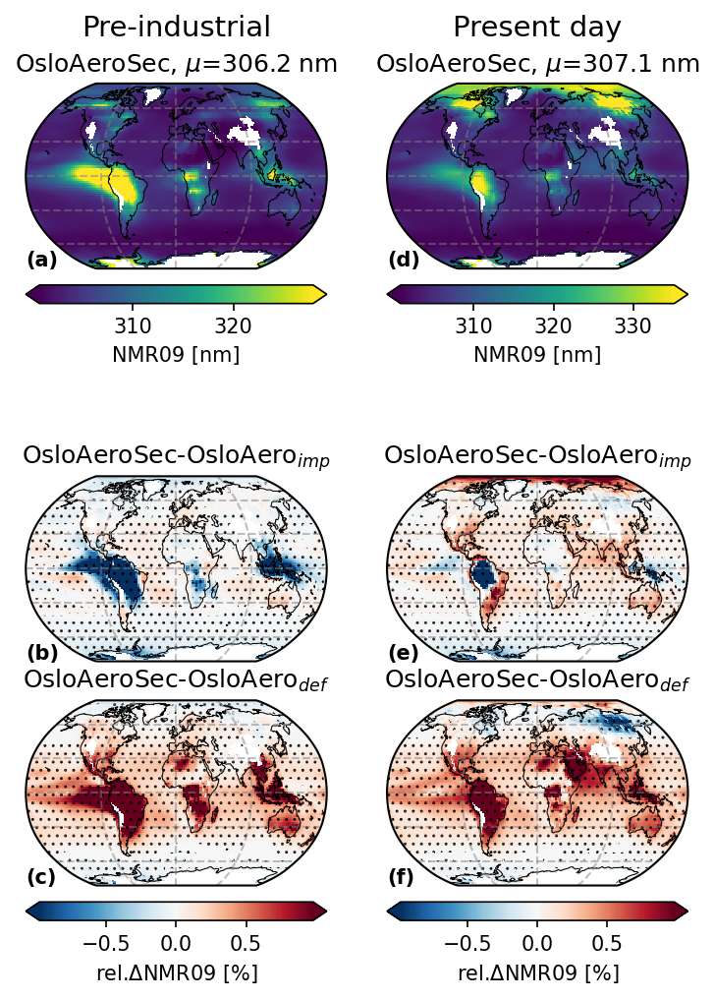

In [75]:
var = 'NMR09'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',

                           hatches=['...', ''],
                           hatch_lw=.6,

                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

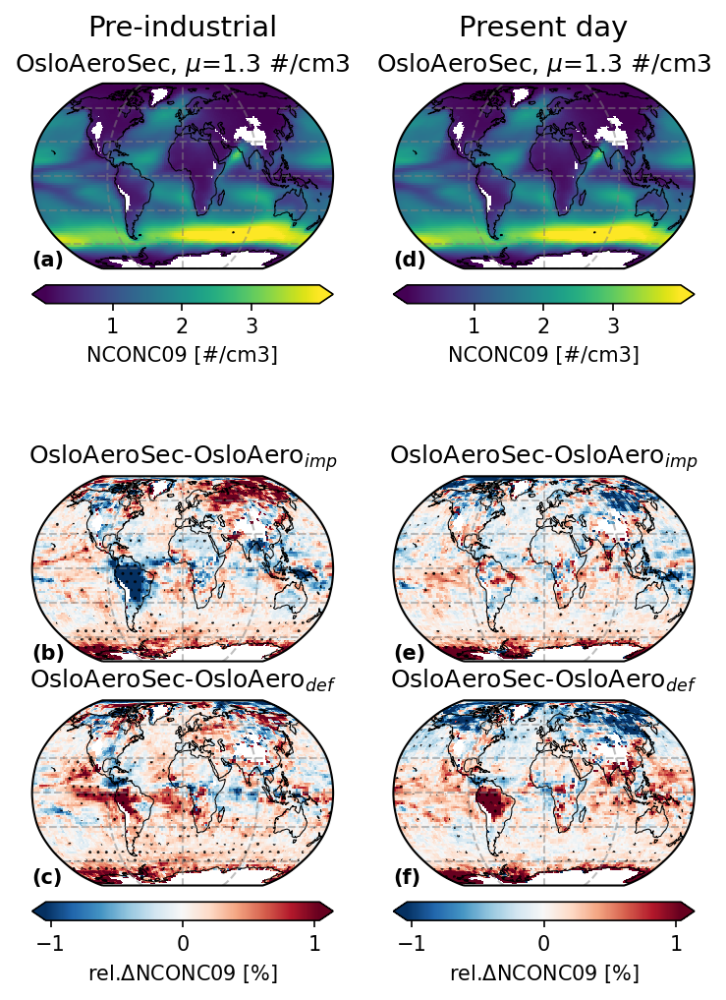

In [76]:
var = 'NCONC09'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,
                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()

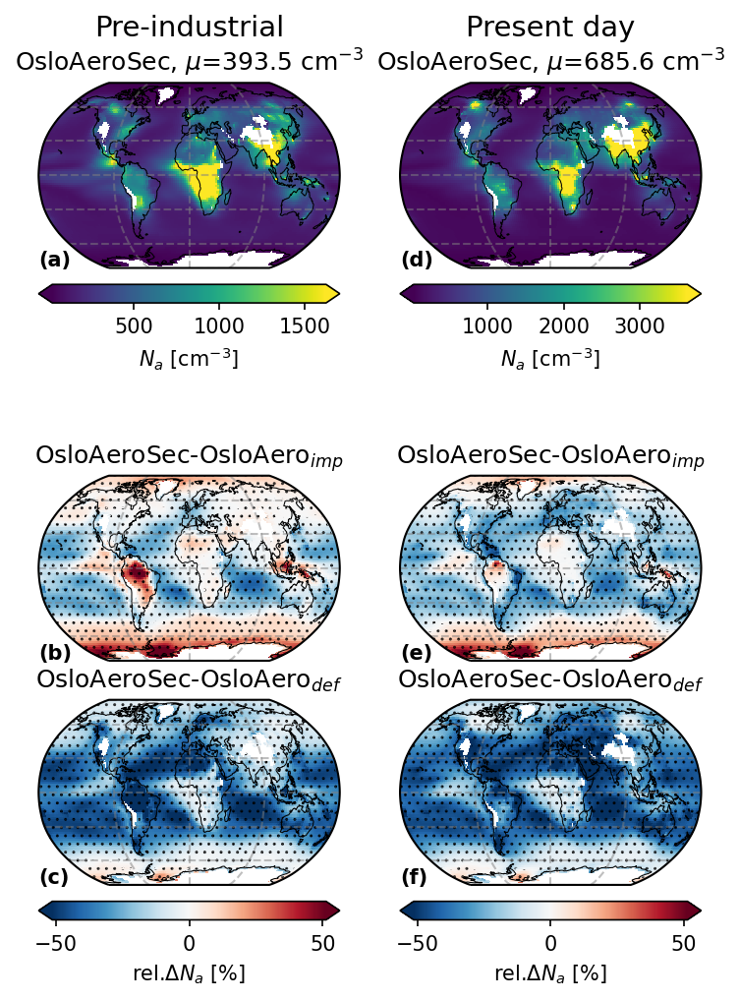

In [77]:
var = 'N_AER'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   type_nndic={'PI': 'Pre-industrial', 'PIaerPD': 'Present day'},
                                   switch_diff=True
                                   )
for ct in ['PI', 'PIaerPD']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',
                           hatches=['...', ''],
                           hatch_lw=.6,

                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
plt.show()